# Linear Regression with Scikit Learn - Machine Learning with Python

**Problem Statement**

**QUESTION**: ACME Insurance Inc. offers affordable health insurance to thousands of customers all over the United States. As the lead data scientist at ACME, **you're tasked with creating an automated system to estimate the annual medical expenditure for new customers**, using information such as their age, sex, BMI, children, smoking habits and region of residence.

An estimate for your system will be used to determine the annual Insurance premium (amount paid every month) offered to the customer. Due to regulatory requirements, you must be able to explain why your system outputs a certain prediction. 

In [1]:
import pandas as pd

In [2]:
medical_df = pd.read_csv('.\data\insurance.csv')

In [3]:
medical_df

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


The dataset contains 1338 rows and 7 columns. Each row of the dataset contains information about one customer.

We aim to find a way to estimate the value in the "charges" column using the values in the other columns. If we can do so for the historical data, we should be able to estimate charges for new customers too, simply by asking for information like their age, sex, BMI, no. of children, smoking habits and region. 

Let's check the data type for each column.

In [4]:
medical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


Here are some statistics for the numerical columns:

In [5]:
medical_df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


## Exploratory Analysis and Visualization

Let's explore the data by visualizing the distribution of values in some columns of the dataset, and the relationships between "charges" and other columns.

We'll use libraries Matplotlib, Seaborn and Plotly for visualizatieatsheet

In [6]:
!pip install plotly matplotlib seaborn --quiet

In [3]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

The following settings will improve the default style and font sizes for our charts.

In [4]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Age

Age is a numeric column. The minimum age in the dataset is 18 and the maximum age is 64. Thus, we can visualize the distribution of age using a histogram with 47 bins (one for each year) and a box plot. We'll use plotly to make the chart interacti.n.

In [8]:
medical_df.age.describe()

count    1338.000000
mean       39.207025
std        14.049960
min        18.000000
25%        27.000000
50%        39.000000
75%        51.000000
max        64.000000
Name: age, dtype: float64

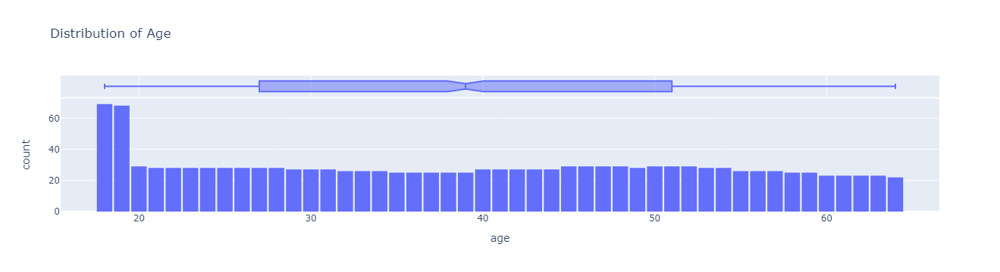

In [9]:
fig = px.histogram(medical_df, 
                   x='age',
                   marginal='box',
                   nbins=47,
                   title='Distribution of Age')
fig.update_layout(bargap=0.1)
fig.show()

The distribution of ages in the dataset is almost uniform, with 20-30 customers at every age, except for the ages 18 and 19, which seem to have over twice as many customers as other ages. The uniform distribution might arise from the fact that there isn't a big variation in the [number of people of any given age](https://jovian.com/outlink?url=https%3A%2F%2Fwww.statista.com%2Fstatistics%2F241488%2Fpopulation-of-the-us-by-sex-and-age%2F) (between 18 & 64) in the USA.

### Body Mass Index

Let's look at the distribution of BMI (Body Mass Index) of customers, using a histogram and box plot.

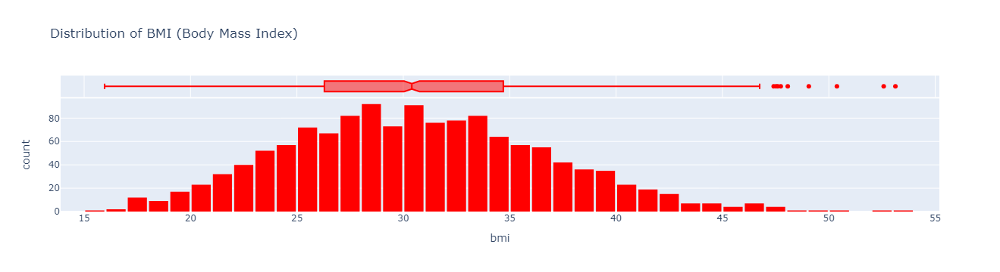

In [10]:
fig = px.histogram(medical_df,
                   x='bmi',
                   marginal='box',
                   color_discrete_sequence=['red'],
                   title='Distribution of BMI (Body Mass Index)')
fig.update_layout(bargap=0.1)
fig.show()

The measurements of body mass index seem to form a [Gaussian distribution](https://en.wikipedia.org/wiki/Normal_distribution) centered around the value 30, with a few outliers towards the right. Here's how BMI values can be interpreted ([source](https://study.com/academy/lesson/what-is-bmi-definition-formula-calculation.html)):

![](https://i.imgur.com/lh23OiY.jpg)

### Charges

Let's visualize the distribution of "charges" i.e. the annual medical charges for customers. This is the column we're trying to predict. Let's also use the categorical column "smoker" to distinguish the charges for smokers and non-smokers.

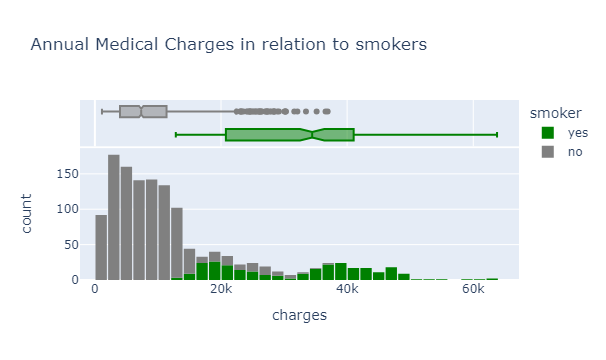

In [13]:
fig = px.histogram(medical_df,
                   x='charges',
                   marginal='box',
                   color='smoker',
                   color_discrete_sequence=['green', 'grey'],
                   title='Annual Medical Charges in relation to smokers')
fig.update_layout(bargap=0.1)
fig.show()

We can make the following observations from the above graph:

* For most customers, the annual medical charges are under \\$10,000. Only a small fraction of customer have higher medical expenses, possibly due to accidents, major illnesses and genetic diseases. The distribution follows a "power law".
* There is a significant difference in medical expenses between smokers and non-smokers. While the median for non-smokers is \\$7,300, the median for smokers is close to \\$35,000.

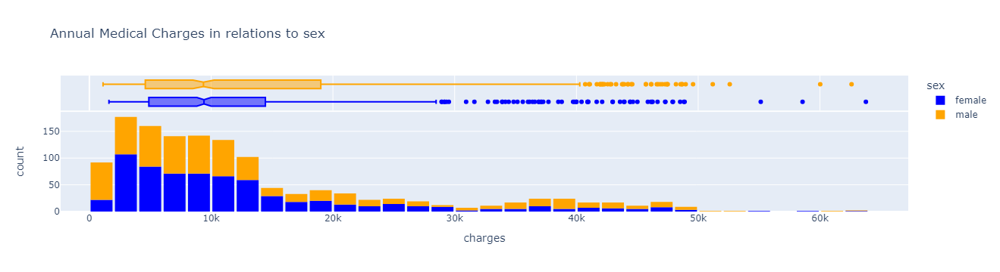

In [12]:
fig = px.histogram(medical_df,
                   x='charges',
                   marginal='box',
                   color='sex',
                   color_discrete_sequence=['blue', 'orange'],
                   title='Annual Medical Charges in relations to sex')
fig.update_layout(bargap=0.1)
fig.show()

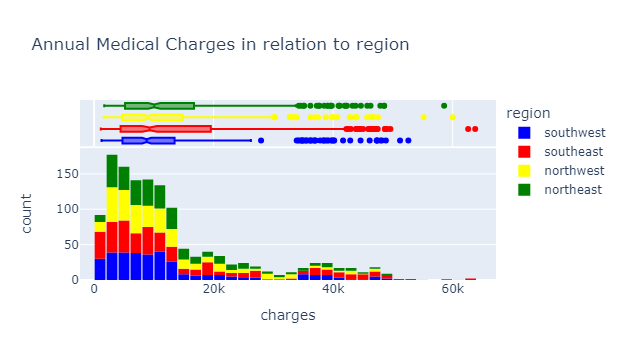

In [14]:
fig = px.histogram(medical_df,
                   x='charges',
                   marginal='box',
                   color='region',
                   color_discrete_sequence=['blue', 'red', 'yellow', 'green'],
                   title='Annual Medical Charges in relation to region')
fig.update_layout(bargap=0.1)
fig.show()

### Smoker

Let's visualize the distribution of the "smoker" column (containing values "yes" and "no") using a histogram.

In [15]:
medical_df.smoker.value_counts()

smoker
no     1064
yes     274
Name: count, dtype: int64

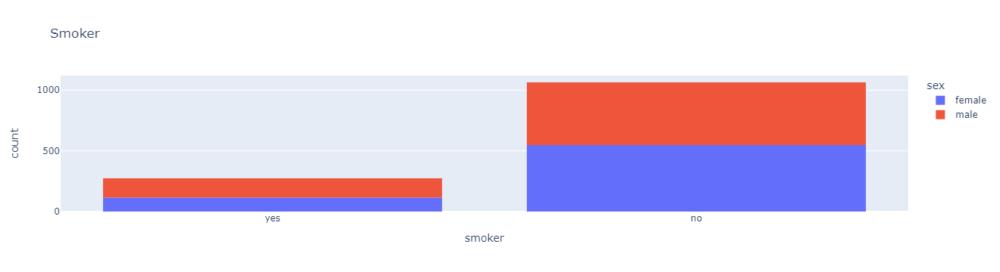

In [16]:
px.histogram(medical_df, x='smoker', color='sex', title='Smoker')

It appears that 20% of customers have reported that they smoke. We can also see that smoking appears a more common habit among males. 58% of smokers are male. 

In [17]:
medical_df.sex.value_counts()

sex
male      676
female    662
Name: count, dtype: int64

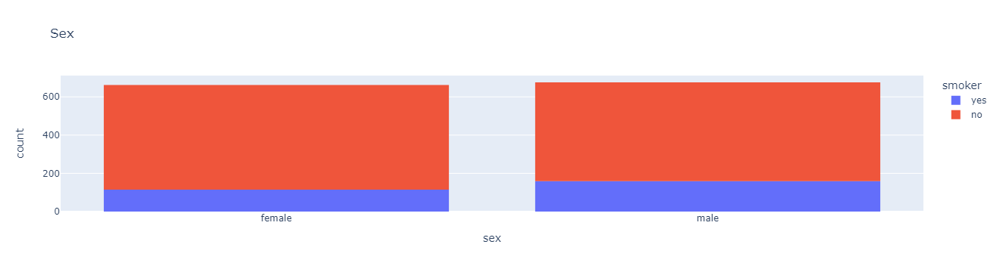

In [24]:
px.histogram(medical_df, x='sex', color='smoker', title='Sex')

In [20]:
medical_df.region.value_counts()

region
southeast    364
southwest    325
northwest    325
northeast    324
Name: count, dtype: int64

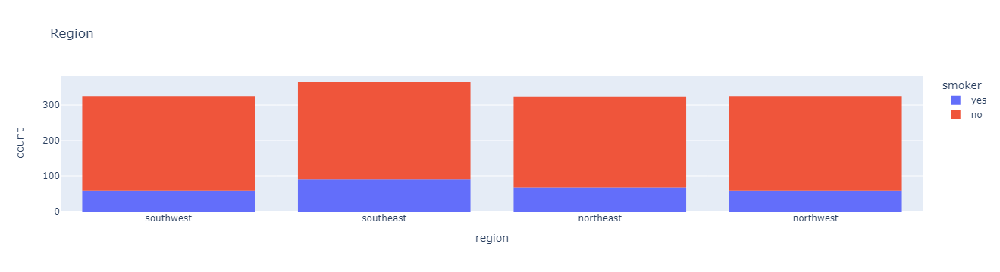

In [21]:
px.histogram(medical_df, x='region', color='smoker', title='Region')

### Age and Charges

Let's visualize the relationship between "age" and "charges" using a scatter plot. Each point in the scatter plot represents one customers. We'll also use values in the "smoker" column to color the points.

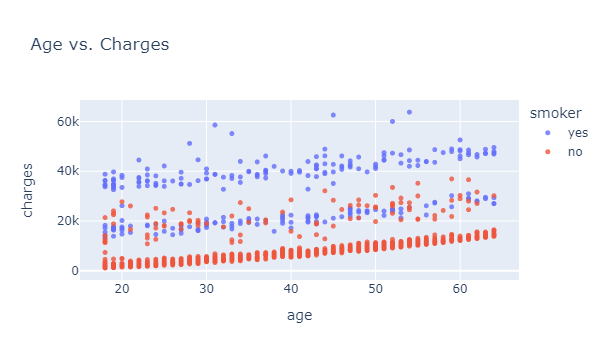

In [25]:
fig = px.scatter(medical_df,
                 x='age',
                 y='charges',
                 color='smoker',
                 opacity=0.8,
                 hover_data=['sex'],
                 title='Age vs. Charges')
fig.update_traces(marker_size=5)
fig.show()

We can make the following observations from the above chart:

* The general trend seems to be that medical charges increse with age, as we might expect. However, there is significant variation at every age, and it's clear that age alone cannot be used to accurately determine medical charges.
* We can see three "clusters" of points, each of which seems to form a line with an increasing slope:
    1. The first and the largest cluster consists primary of presumably "healthy non-smokers" who have relatively low medical charges compared to others.
    2. The second cluster contains a mix of smokers and non-smokers. It's possible that these are actually two distinct but overlapping clusters: "non-smokers with medical issues" and "smokers without major medical issues".
    3. The final cluster consists axclusively of smokers, presumably smokers with major medical issues that are possibly related to or worsened by smoking.

### BMI and Charges

Let's visulaize relationship between BMI (body mass index) and charges using another scatter plot. Once again we'll use the values from the "smoker" column to color the points.

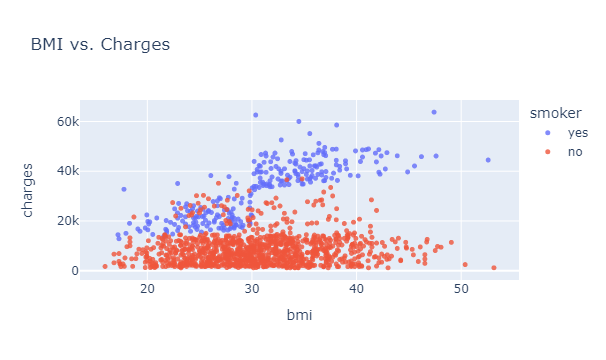

In [10]:
fig = px.scatter(medical_df,
                 x='bmi',
                 y='charges',
                 color='smoker',
                 opacity=0.8,
                 hover_data=['sex'],
                 title='BMI vs. Charges')
fig.update_traces(marker_size=5)
fig.show()

It appears that for non-smokers, an increase in BMI doesn't seem to be related to an increase in medical charges. However, medical charges seem to be significantly higher for smokers with a BMI greater than 30.

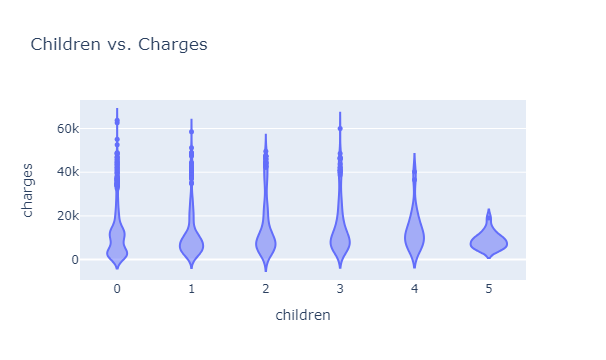

In [26]:
fig = px.violin(medical_df,
                x='children',
                y='charges',
                title='Children vs. Charges')
fig.update_traces(marker_size=5)
fig.show()

[]

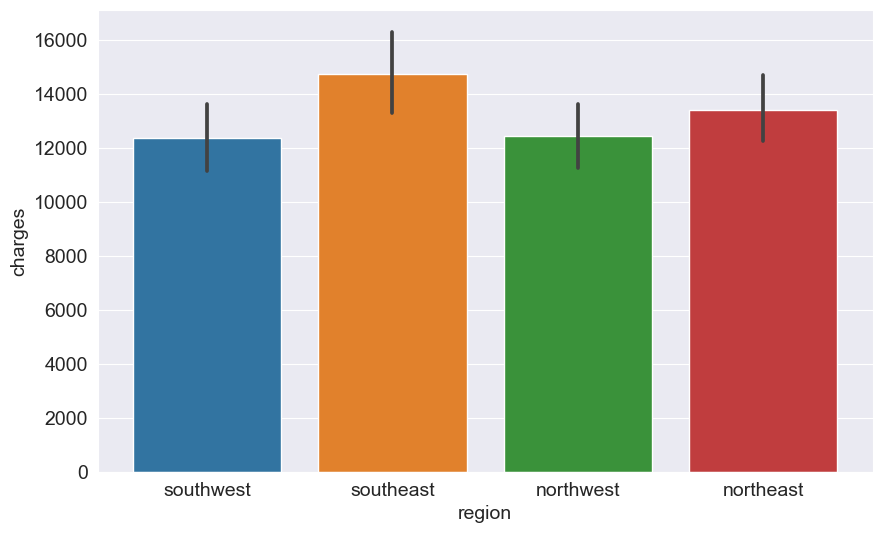

In [21]:
fig = sns.barplot(data=medical_df,
                  x='region',
                  y='charges',
                  estimator='mean',
                  errorbar=("ci", 95),
                  n_boot=1000,
                  saturation=.75,
                  width=.8,
                  errcolor=".26",
                  dodge=True,
                  ci="deprecated")
fig.plot()

[]

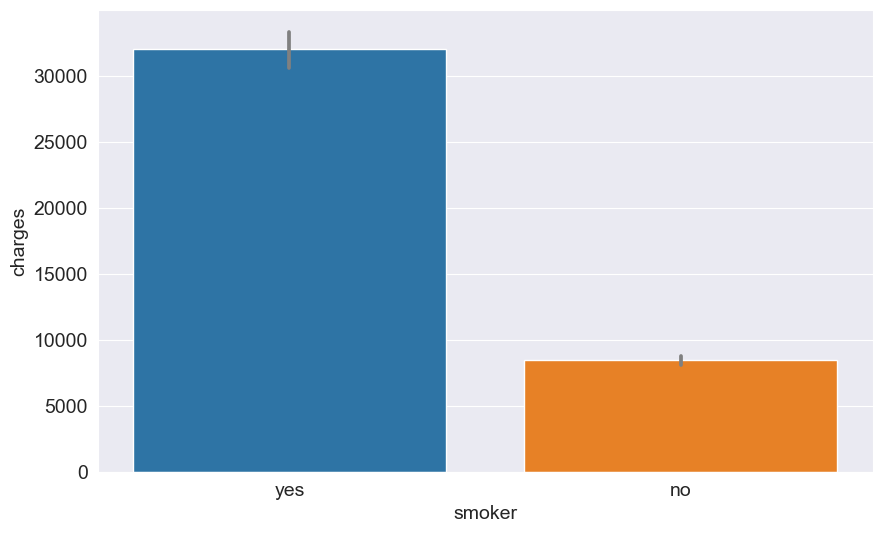

In [24]:
fig = sns.barplot(data=medical_df,
                  x='smoker',
                  y='charges',
                  estimator='mean',
                  errorbar=('ci', 95),
                  n_boot=1000,
                  saturation=.8,
                  width=.8,
                  errcolor='.5',
                  dodge=True,
                  ci='deprecated')
fig.plot()

### Correlation

As you can tell from the analysis, the values in some columns are more closely related to the values in "charges" compared to other columns. E.g. "age" and "charges" seem to grow together, whereas "bmi" and "charges" don't.

In [27]:
medical_df.charges.corr(medical_df.age)

0.2990081933306477

In [28]:
medical_df.charges.corr(medical_df.bmi)

0.19834096883362887

In [32]:
medical_df.charges.corr(medical_df.children)

0.06799822684790481

Correlation for categorical columns.

In [33]:
smoker_values = {'no': 0, 'yes': 1}
smoker_numeric = medical_df.smoker.map(smoker_values) # convert categorical data into a numeric data

In [34]:
medical_df.charges.corr(smoker_numeric)

0.7872514304984771

In [8]:
medical_df.age.corr(medical_df.age)

0.9999999999999999

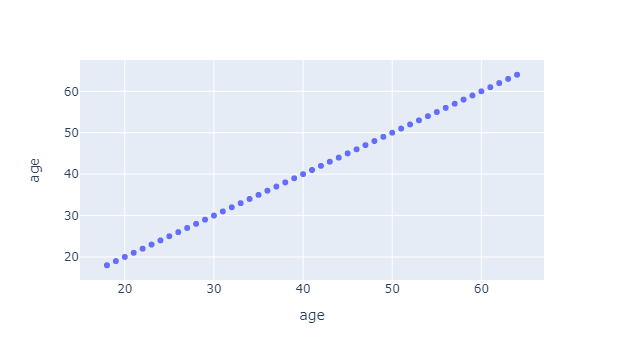

In [9]:
px.scatter(medical_df, x='age', y='age')

`.corr` method to compute the correlation coefficients between all pairs of numeric columns

In [15]:
selected_cols = ['age', 'bmi', 'children', 'charges']
corr_medical_df = medical_df[selected_cols].copy()
corr_medical_df

,age,bmi,children,charges
0,19,27.900,0,16884.92400
1,18,33.770,1,1725.55230
2,28,33.000,3,4449.46200
3,33,22.705,0,21984.47061
4,32,28.880,0,3866.85520
...,...,...,...,...
1333,50,30.970,3,10600.54830
1334,18,31.920,0,2205.98080
1335,18,36.850,0,1629.83350
1336,21,25.800,0,2007.94500


In [16]:
corr_medical_df.corr()

,age,bmi,children,charges
age,1.000000,0.109272,0.042469,0.299008
bmi,0.109272,1.000000,0.012759,0.198341
children,0.042469,0.012759,1.000000,0.067998
charges,0.299008,0.198341,0.067998,1.000000


Correlation matrix (i.e. the result for `.corr` method) using heatmap visualization.

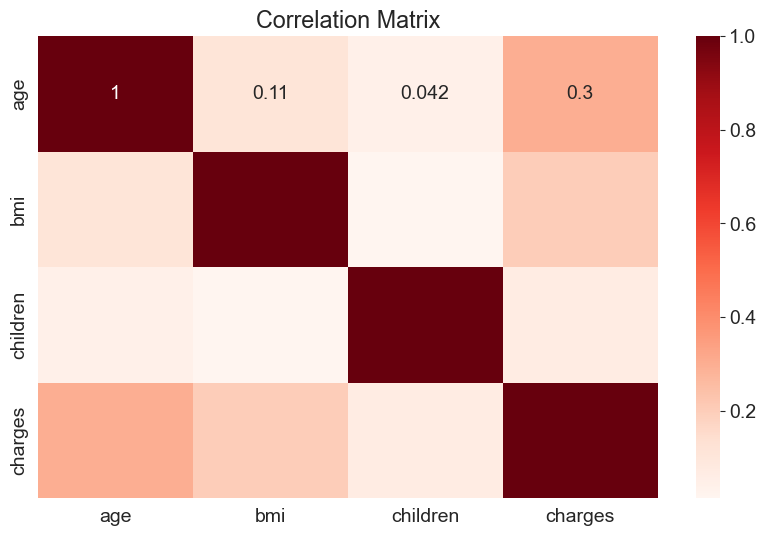

In [17]:
sns.heatmap(corr_medical_df.corr(), cmap='Reds', annot=True)
plt.title('Correlation Matrix');

## Linear Regression using a Single Feature

We now know that the "smoker" and "age" columns have the _strongest_ correlation with "charges". Let's try to find a way of estimating the value of "charges" using the value of "age" for non-smokers. First, let's create a data frame containing just the data for non-smokers.  

In [5]:
non_smoker_df = medical_df[medical_df.smoker == 'no']
non_smoker_df

,age,sex,bmi,children,smoker,region,charges
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
...,...,...,...,...,...,...,...
1332,52,female,44.700,3,no,southwest,11411.68500
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350


Next, let's visualize the relationship between "age" and "charges"

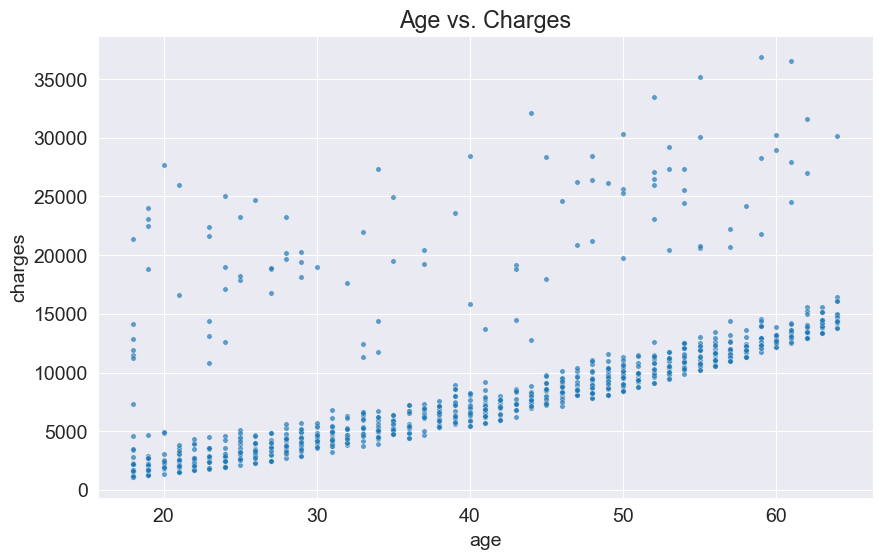

In [20]:
plt.title('Age vs. Charges')
sns.scatterplot(data=non_smoker_df, x='age', y='charges', alpha=.7, s=15);

Apart from a few exceptions, the points seem to form a line. We'll try and "fit" a line using this points, and use the line to predict charges for a given age. A line on the X&Y coordinates has the following formula:

$y=wx+b$

### Model 
In the above case, the $x$ axis shows "age" and the $y$ aixs shows "charges". Thus, we'll assume the the following relationship between the two:

$charges = w \times age + b$

We'll try determine $w$ and $b$ for the line that best fits the data.

* This technique is called _linear regression_, and we call the above equation a _linear regression model_, because it models the relationship between "age" and "charges" as a straight line.
* The numbers $w$ and $b$ are called the _parameters_ or _weights_ of the model.
* The value in the "age" column of the dataset are called the _inputs_ to the model and the values in the "charges" column are called _targets_.

Let define a helper function `estimate_charges`, to compute _charges_, given _age_, $w$ and $b$.

In [7]:
def estimate_charges(age, w, b):
    return w * age + b

The `estimate_charges` function is our very first _model_.

Let's _guess_ the value for $w$ and $b$ and use them to estimate the value for charges.

In [8]:
w = 50
b = 100

In [9]:
ages = non_smoker_df.age
estimate_charges = estimate_charges(ages, w, b)
estimate_charges

1       1000
2       1500
3       1750
4       1700
5       1650
        ... 
1332    2700
1333    2600
1334    1000
1335    1000
1336    1150
Name: age, Length: 1064, dtype: int64

In [10]:
non_smoker_df.charges

1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64

Plot for estimnated charges using a line graph.

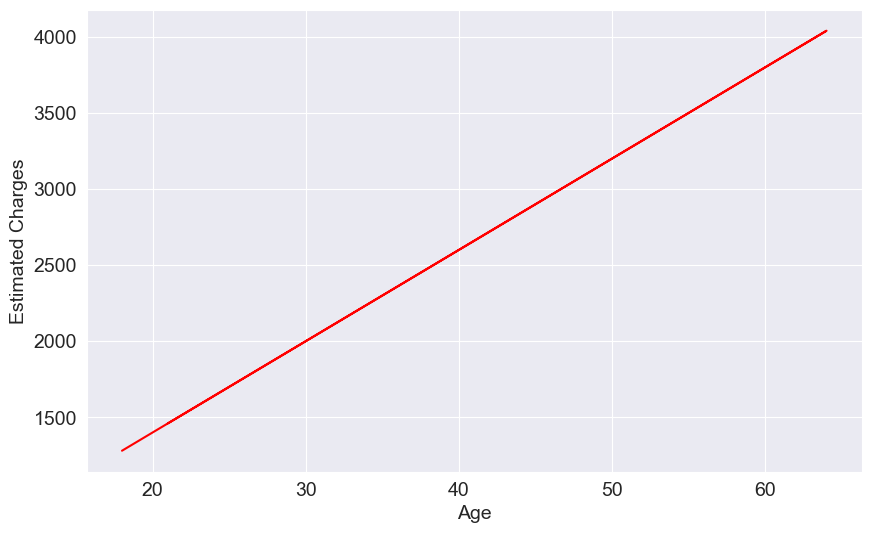

In [11]:
plt.plot(ages, estimate_charges, 'r-')
plt.xlabel('Age')
plt.ylabel('Estimated Charges');

As expected, the points lie on a straight line.

We can overlay this line on the actual data, so we see how well our _model_ fits the data.

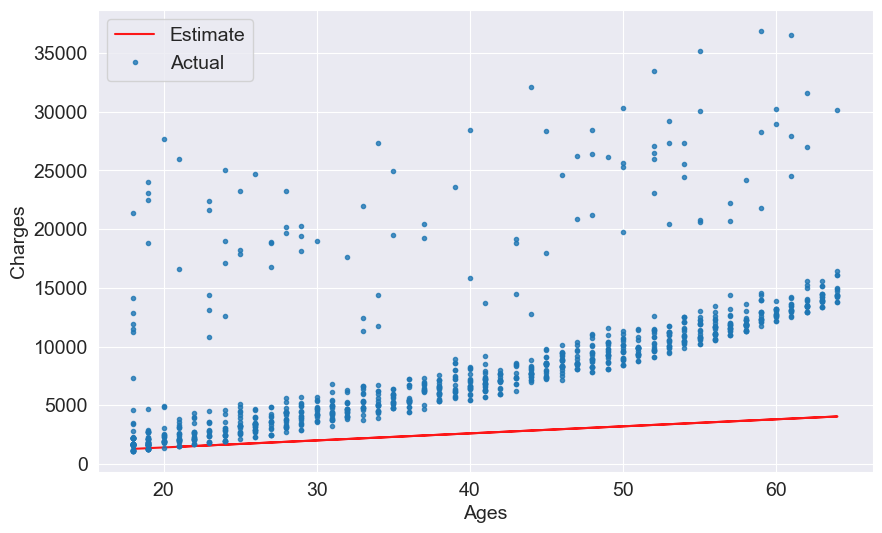

In [12]:
target = non_smoker_df.charges

plt.plot(ages, estimate_charges, 'r', alpha=.9);

plt.plot(ages, target, '.', alpha=.8);
plt.xlabel('Ages')
plt.ylabel('Charges')
plt.legend(['Estimate', 'Actual']);

In [13]:
def try_parameters(w, b):
    ages = non_smoker_df.age
    target = non_smoker_df.charges
    
    estimate_charges = w * ages + b

    plt.plot(ages, estimate_charges, 'r', alpha=.9);
    plt.scatter(ages, target, alpha=.8);
    plt.xlabel('Ages');
    plt.ylabel('Charges');
    plt.legend(['Estimate', 'Actual']);

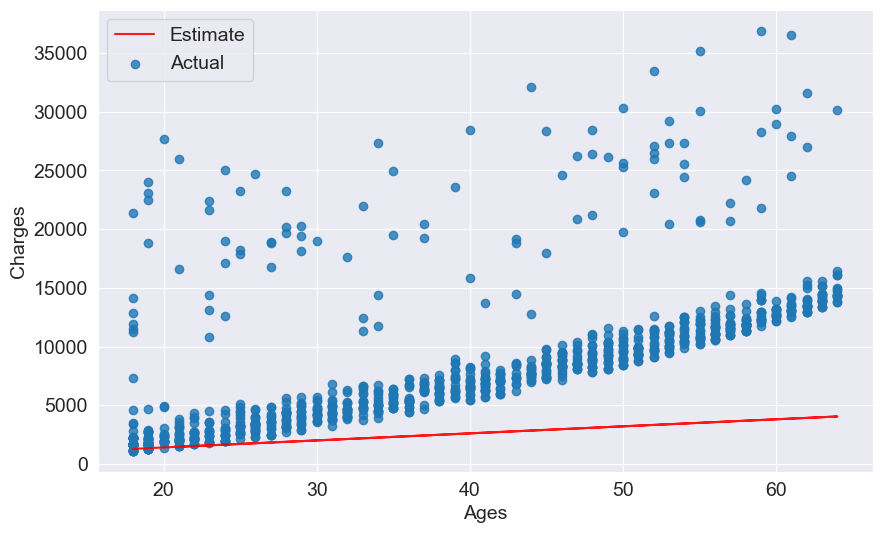

In [27]:
try_parameters(60, 200)

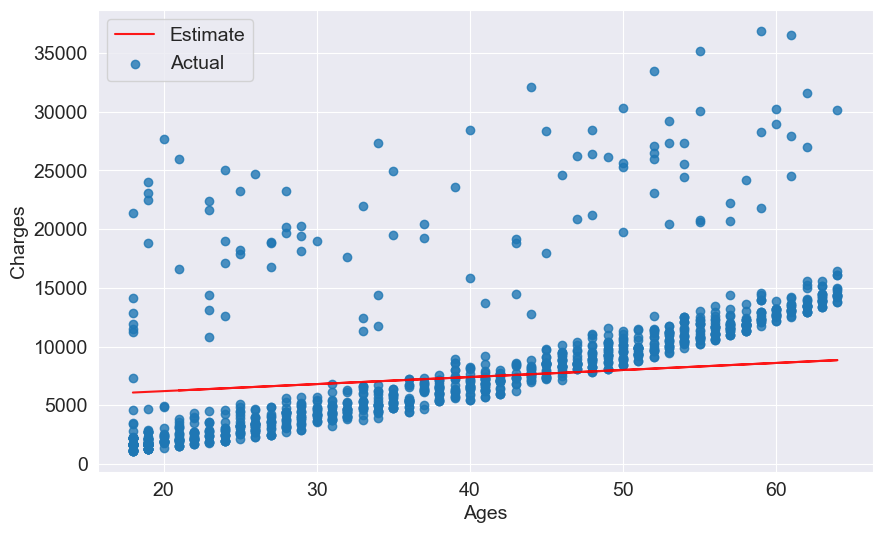

In [29]:
try_parameters(60, 5000)

In [21]:
import numpy as np

In [6]:
def rmse(targets, predictions):
    return np.sqrt(np.mean(np.square(targets - predictions)))

Let's compute the Root mean square error (RMSE) for our model with a sample set of weights

In [11]:
w = 50
b = 100

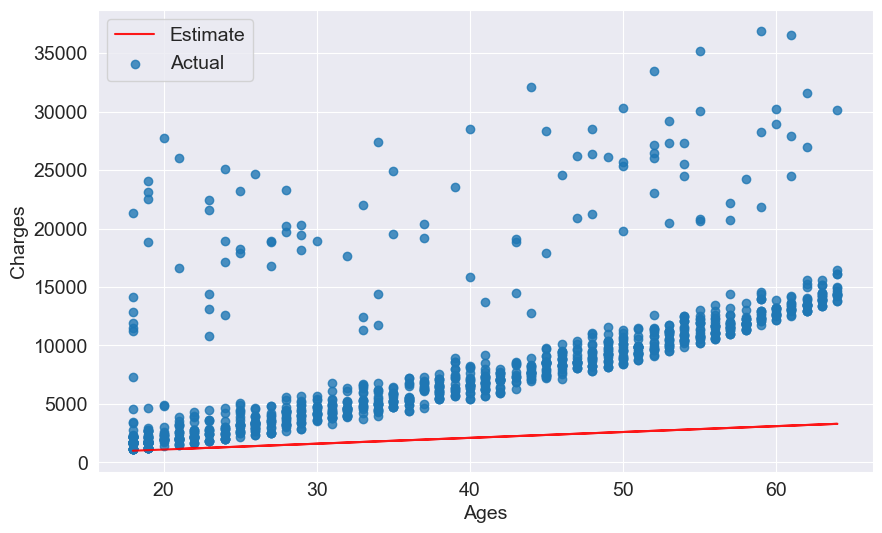

In [14]:
try_parameters(w, b)

In [15]:
targets = non_smoker_df['charges']
predictions = w * non_smoker_df.age + b
rmse(targets, predictions)

8461.949562575493

Interpretation of the above number: On _average, each element in the prediction differs from the actual target by $8461._ 

The result is called the _loss_ because it indicates how bad the model is at predicting the target varibles. It represents information loss in the model: the lower the loss, the better the model.

Let's modify the `try_parameters` function to display the loss.

In [16]:
def try_parameters(w, b):
    ages = non_smoker_df['age']
    targets = non_smoker_df['charges']
    predictions = w * ages + b

    plt.plot(ages, predictions, 'r', alpha=.9);
    plt.plot(ages, targets, '.', alpha=.8);
    plt.xlabel('Ages');
    plt.ylabel('Charges');
    plt.legend(['Prediction', 'Actual']);

    loss = rmse(targets, predictions)
    print(f'RMSE Loss: {loss}')

RMSE Loss: 8461.949562575493


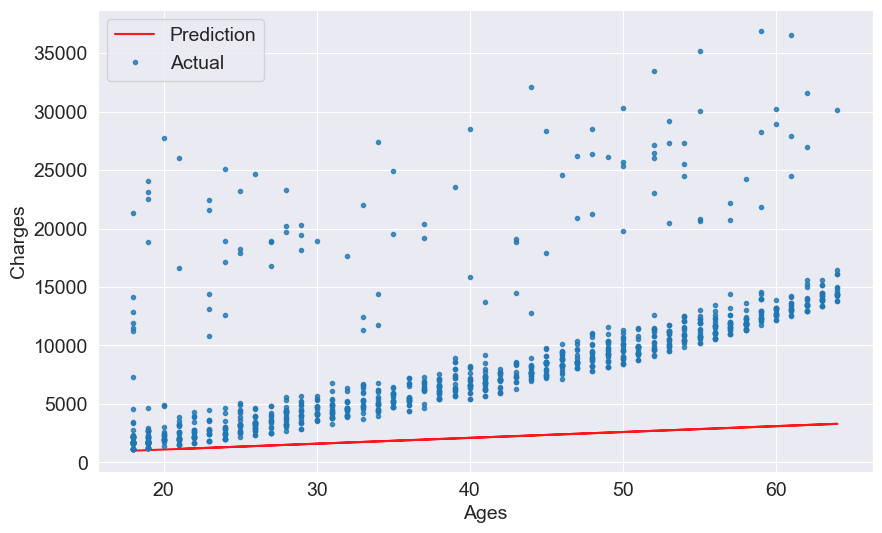

In [46]:
try_parameters(50, 100)

RMSE Loss: 7266.699605113179


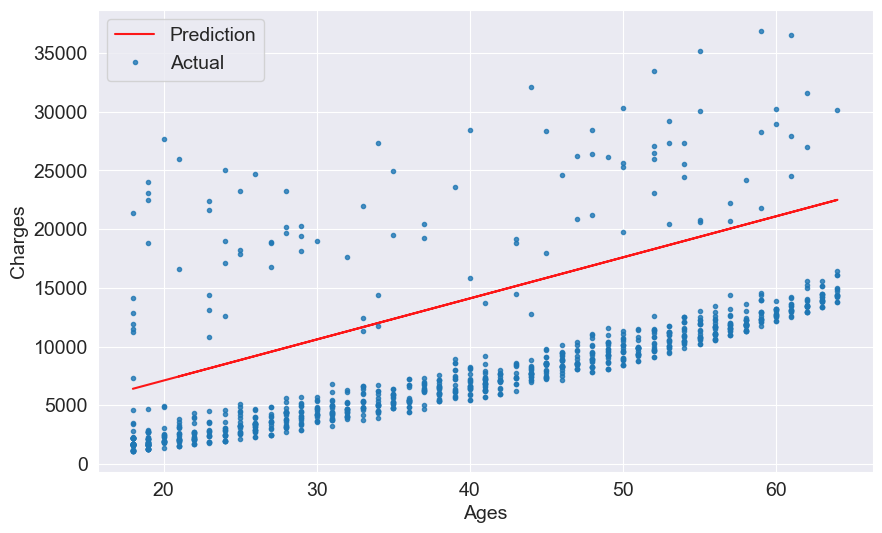

In [17]:
try_parameters(350, 100)

RMSE Loss: 4991.993804156943


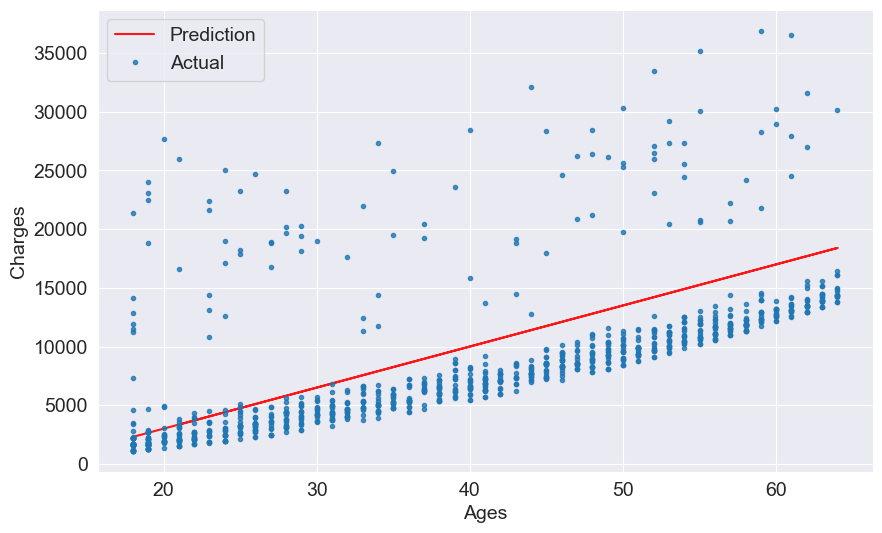

In [18]:
try_parameters(350, -4000)

### Optimizer

Next, we need a strategy to modify weights `w` and `b` to reduce the loss and improve the __fit__ of the line to the data.
* Ordinary Least Square: (better for smaller datasets)
* Stochastic gradient descent: (better for larger datasets)

Both of these have the same objective: to minimize the loss, however, while ordinary least squares directly computes the best values for `w` and `b` using the matrix operations. The stochastic gradient descent uses an iterative approach, starting with a random values of `w` and `b` and slowly improving them using derivatives.



### Linear Regression using Scikit-learn
In practice, you'll never need to implement either of the above methods yourself. You can use a library like `scikit-learn` to do this for you.

In [50]:
!pip install scikit-learn --quiet

Let's use the `LinearRegression` class from `scikit-learn` to find the best fit line for __age__ vs. __charges__ using the ordinary least square optimization techniques.

In [49]:
from sklearn.linear_model import LinearRegression # Ordinary least square

In [20]:
model = LinearRegression() # First, we create a new model object.

In [21]:
help(model.fit)

Help on method fit in module sklearn.linear_model._base:

fit(X, y, sample_weight=None) method of sklearn.linear_model._base.LinearRegression instance
    Fit linear model.
    
    Parameters
    ----------
    X : {array-like, sparse matrix} of shape (n_samples, n_features)
        Training data.
    
    y : array-like of shape (n_samples,) or (n_samples, n_targets)
        Target values. Will be cast to X's dtype if necessary.
    
    sample_weight : array-like of shape (n_samples,), default=None
        Individual weights for each sample.
    
        .. versionadded:: 0.17
           parameter *sample_weight* support to LinearRegression.
    
    Returns
    -------
    self : object
        Fitted Estimator.



In [22]:
inputs = non_smoker_df[['age']]
targets = non_smoker_df.charges
print('inputs.shape: ', inputs.shape)
print('targets.shape: ', targets.shape)

inputs.shape:  (1064, 1)
targets.shape:  (1064,)


Let's fit the model to the data.

In [23]:
model.fit(inputs, targets)

LinearRegression()

We can now make predictions using the model. Let's try predicting the charges for the ages 23, 37, and 61

In [24]:
model.predict(np.array([[23],
                       [37],
                       [61]]))

C:\Users\seyi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([ 4055.30443855,  7796.78921819, 14210.76312614])

In [25]:
predictions = model.predict(inputs)

In [26]:
predictions

array([2719.0598744 , 5391.54900271, 6727.79356686, ..., 2719.0598744 ,
       2719.0598744 , 3520.80661289])

Let's compute the RMSE loss to evaluate the model

In [27]:
rmse(targets, predictions)

4662.505766636395

Seems like our prediction is off by $4,000 on average, which is not too bad considering the fact that there are several outliers.

The parameters of the model are stored in the `.coef_` and `.intercepts_` properties.

In [28]:
model.coef_ # w

array([267.24891283])

In [29]:
model.intercept_ # b

-2091.420556565079

Let's visualize the line created by the above parameters.

RMSE Loss: 4662.505766636395


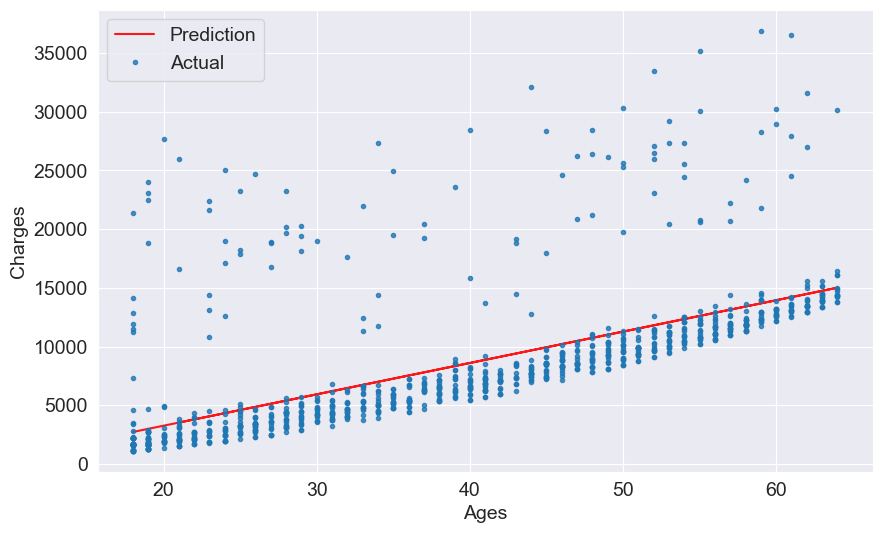

In [30]:
try_parameters(model.coef_, model.intercept_)

Indeed the line is quite close to the points. It is slightly above the cluster of points, because it's also trying to account for the outliers.

In [34]:
from sklearn.linear_model import SGDRegressor # Stochastic gradient descent

In [35]:
model = SGDRegressor()

In [38]:
help(model.predict)

Help on method predict in module sklearn.linear_model._stochastic_gradient:

predict(X) method of sklearn.linear_model._stochastic_gradient.SGDRegressor instance
    Predict using the linear model.
    
    Parameters
    ----------
    X : {array-like, sparse matrix}, shape (n_samples, n_features)
        Input data.
    
    Returns
    -------
    ndarray of shape (n_samples,)
       Predicted target values per element in X.



In [34]:
inputs = non_smoker_df[['age']]
targets = non_smoker_df.charges
print('inputs.shape: ', inputs.shape)
print('targets.shape: ', targets.shape)

inputs.shape:  (1064, 1)
targets.shape:  (1064,)


In [36]:
help(model.fit)

Help on method fit in module sklearn.linear_model._stochastic_gradient:

fit(X, y, coef_init=None, intercept_init=None, sample_weight=None) method of sklearn.linear_model._stochastic_gradient.SGDRegressor instance
    Fit linear model with Stochastic Gradient Descent.
    
    Parameters
    ----------
    X : {array-like, sparse matrix}, shape (n_samples, n_features)
        Training data.
    
    y : ndarray of shape (n_samples,)
        Target values.
    
    coef_init : ndarray of shape (n_features,), default=None
        The initial coefficients to warm-start the optimization.
    
    intercept_init : ndarray of shape (1,), default=None
        The initial intercept to warm-start the optimization.
    
    sample_weight : array-like, shape (n_samples,), default=None
        Weights applied to individual samples (1. for unweighted).
    
    Returns
    -------
    self : object
        Fitted `SGDRegressor` estimator.



In [37]:
model.fit(inputs, targets)

SGDRegressor()

In [39]:
predictions = model.predict(inputs)

In [40]:
predictions

array([4792.62378769, 6760.37783842, 7744.25486379, ..., 4792.62378769,
       4792.62378769, 5382.95000291])

In [41]:
targets

1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64

In [43]:
rmse(targets, predictions)

4800.415246514034

In [45]:
model.coef_ # w

array([196.77540507])

In [47]:
model.intercept_ # b

array([1250.66649636])

RMSE Loss: 4800.415246514034


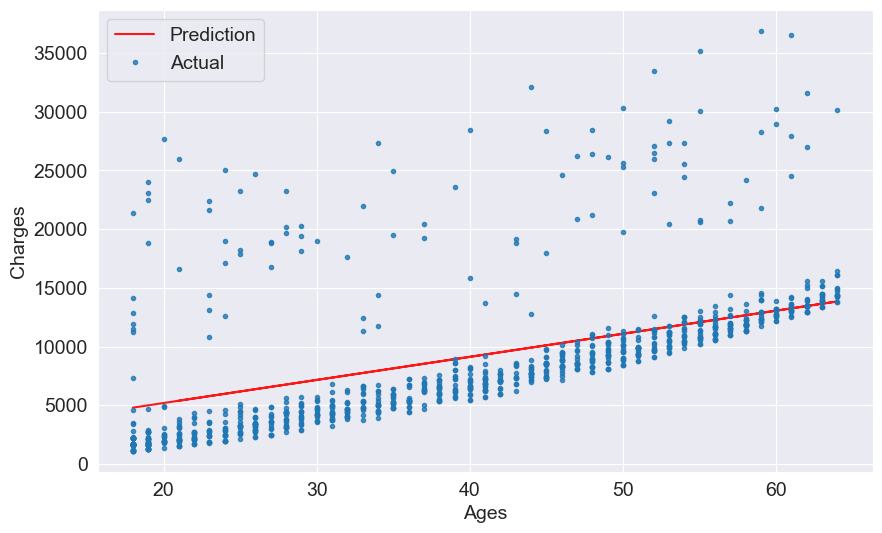

In [51]:
try_parameters(model.coef_, model.intercept_)

Let's repeat the steps in this section to:
* Train a linear regression model to estimate medical charges for smokers.
* Visualize the targets and predictions, and compute the loss.

In [13]:
# Solution
smoker_df = medical_df[medical_df.smoker=='yes']
smoker_df

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
11,62,female,26.290,0,yes,southeast,27808.72510
14,27,male,42.130,0,yes,southeast,39611.75770
19,30,male,35.300,0,yes,southwest,36837.46700
23,34,female,31.920,1,yes,northeast,37701.87680
...,...,...,...,...,...,...,...
1313,19,female,34.700,2,yes,southwest,36397.57600
1314,30,female,23.655,3,yes,northwest,18765.87545
1321,62,male,26.695,0,yes,northeast,28101.33305
1323,42,female,40.370,2,yes,southeast,43896.37630


In [17]:
def try_parameters(w1, b1, w2, b2):
    ages = smoker_df.age
    target = smoker_df.charges
    
    estimate_charges01 = w1 * ages + b1
    estimate_charges02 = w2 * ages + b2

    plt.plot(ages, estimate_charges01, 'r', alpha=.9);
    plt.plot(ages, estimate_charges02, 'b', alpha=.9);

    
    plt.scatter(ages, target, alpha=.8);
    
    plt.xlabel('Ages');
    plt.ylabel('Charges');
    plt.legend(['Estimate', 'Actual']);

    

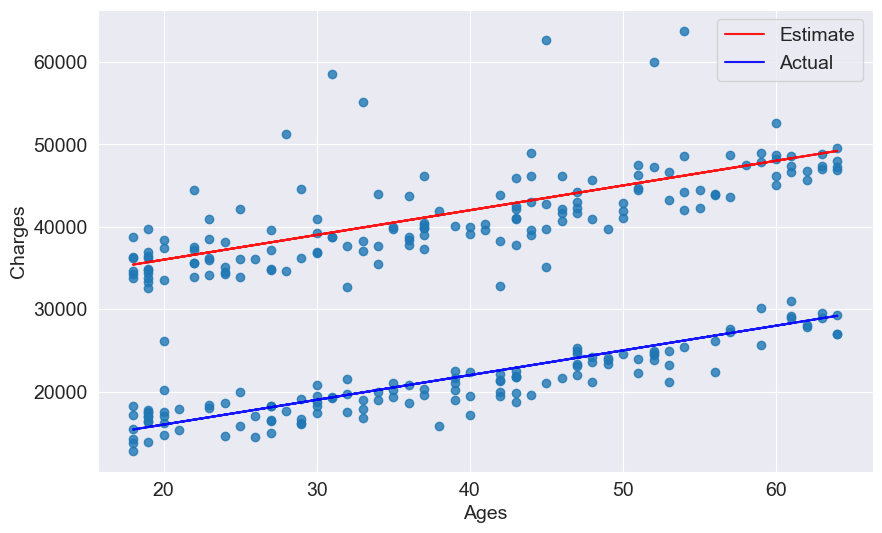

In [21]:
try_parameters(300, 30000, 300, 10000)

In [28]:
w, b = 300, 10000
target = smoker_df['charges']
predictions = w * smoker_df.age + b
rmse(target, predictions)

14996.4597856559

In [29]:
target

0       16884.92400
11      27808.72510
14      39611.75770
19      36837.46700
23      37701.87680
           ...     
1313    36397.57600
1314    18765.87545
1321    28101.33305
1323    43896.37630
1337    29141.36030
Name: charges, Length: 274, dtype: float64

In [30]:
predictions

0       15700
11      28600
14      18100
19      19000
23      20200
        ...  
1313    15700
1314    19000
1321    28600
1323    22600
1337    28300
Name: age, Length: 274, dtype: int64

In [95]:
def try_parameters(w1, b1, w2=0, b2=0):
    ages = smoker_df.age
    targets = smoker_df.charges
    
    predictions01 = w1 * ages + b1
    predictions02 = w2 * ages + b2

    if w2 == 0 and b2 == 0:
        plt.plot(ages, predictions01, 'r', alpha=.9);
        loss1 = rmse(targets, predictions01)
        print(f'RMSE Loss: {loss1}')
    else:
        plt.plot(ages, predictions01, 'r', alpha=.9);
        plt.plot(ages, predictions02, 'b', alpha=.9);

        loss1 = rmse(targets, predictions01)
        loss2 = rmse(targets, predictions02)
        print(f'RMSE Loss1: {loss1}, RMSE Loss2: {loss2}')
    
    plt.scatter(ages, targets, alpha=.8);
    
    plt.xlabel('Ages');
    plt.ylabel('Charges');
    plt.legend(['Estimate', 'Actual']);

RMSE Loss1: 14319.906260979244, RMSE Loss2: 14996.4597856559


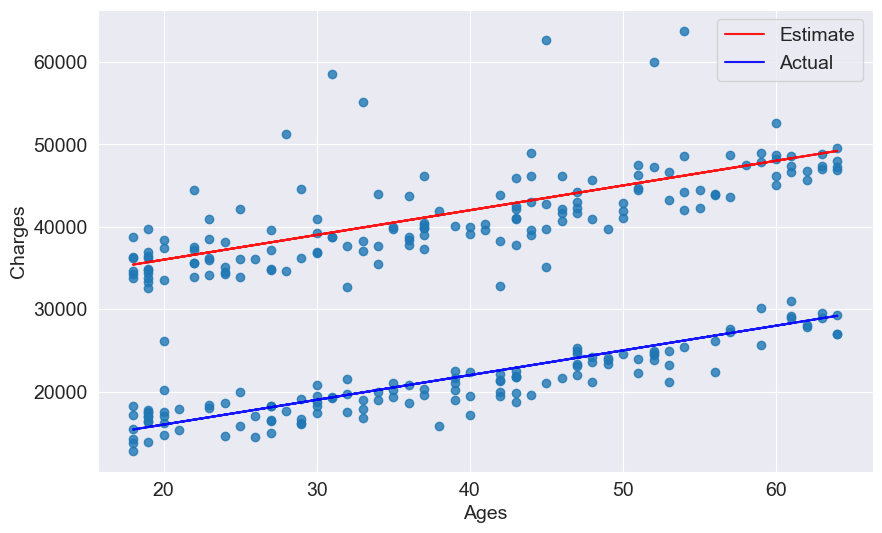

In [96]:
try_parameters(300, 30000, 300, 10000)

In [53]:
from sklearn.linear_model import LinearRegression

In [54]:
model = LinearRegression()

In [55]:
input = smoker_df[['age']]
target = smoker_df.charges

In [57]:
model.fit(input, target)

LinearRegression()

In [59]:
predictions = model.predict(input)

In [60]:
rmse(target, predictions)

10711.00334810241

In [63]:
w2 = model.coef_ # w2

In [64]:
b2 = model.intercept_ # b2

RMSE Loss: 10711.00334810241


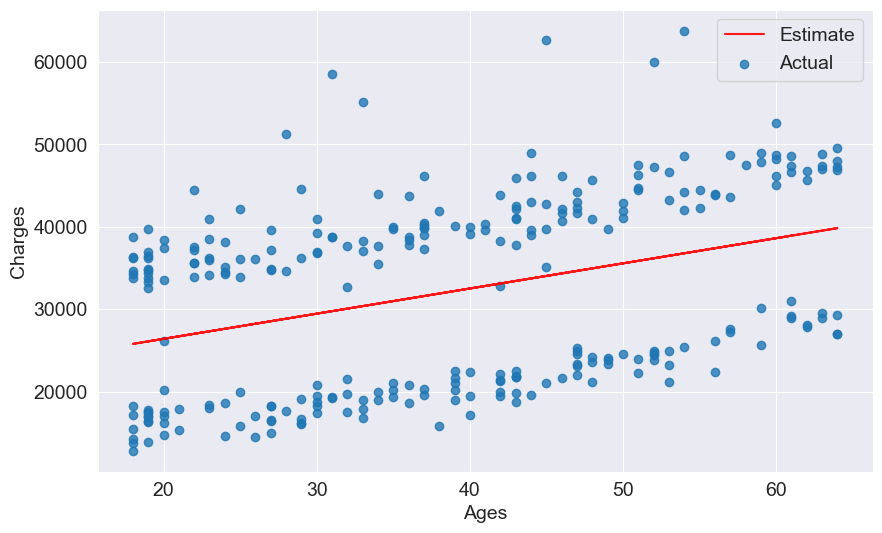

In [97]:
try_parameters(w2, b2)

## Machine Learning (ML)
Machine learning is simply the process of computing the best parameters to model the relationship between some feature and targets.

Every ML problem has three components:

1. **Model**

2. **Cost Function**

3. **Optimizer**

The relationship between these three components can be visualized this way:

<img src="https://i.imgur.com/oiGQFJ9.png" width="480">

In [106]:
from sklearn.linear_model import LinearRegression

# Create inputs and targets
inputs, targets = non_smoker_df[['age']], non_smoker_df['charges']

# Create and train model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 4662.505766636395


### Linear Regression using Multiple Features

$charges = w_1 \times age + w_2 \times bmi + b$ 

This is a plane in 3D

In [8]:
from sklearn.linear_model import LinearRegression

In [9]:
# Create inputs and targets
inputs, targets = non_smoker_df[['age', 'bmi']], non_smoker_df['charges']

# Create and train the model 
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 4662.3128354612945


Adding BMI doesn't seem to reduce the loss by much, as the BMI has a very weak correlation with charges, especially for non smokers.

In [10]:
non_smoker_df.bmi.corr(non_smoker_df.charges)

0.08403654312833274

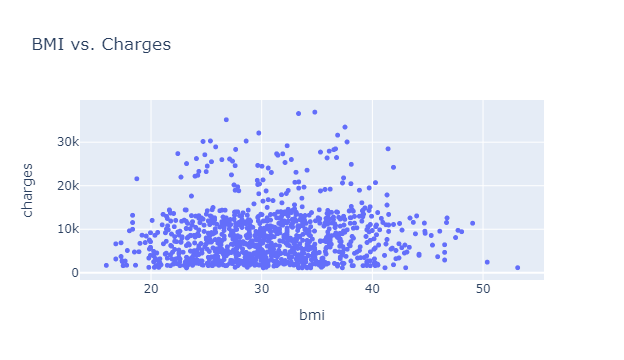

In [11]:
fig = px.scatter(non_smoker_df, x='bmi', y='charges', title='BMI vs. Charges')
fig.update_traces(marker_size=5)
fig.show()

Visualization between all 3 variables "age", "bmi", and "charges" using a 3D scatter plot.

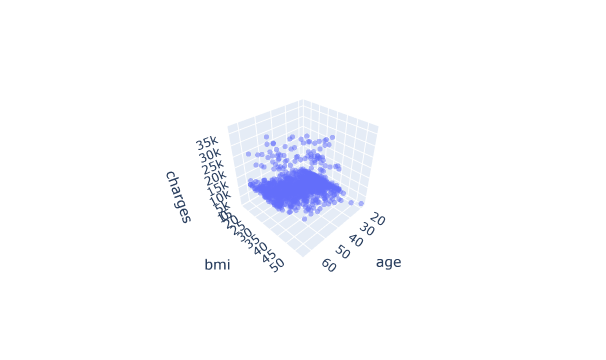

In [12]:
fig = px.scatter_3d(non_smoker_df, x='age', y='bmi', z='charges')
fig.update_traces(marker_size=3, marker_opacity=.5)
fig.show()

It's harder to interprete a 3D scatter plot compared to a 2D scatter plot. As we add more features, it becomes impossible to visualize all feature at once. Hence, we use measures like correlation and loss.

In [13]:
# Parmeters of the model
model.coef_, model.intercept_

(array([266.87657817,   7.07547666]), -2293.6320906488654)

Clearly, BMI has a much lower weightage, and you can see why. It has a tiny contribution. 

To train a linear regression model to estimate charges using BMI alone. 

$charges = w \times bmi + b$

In [14]:
# Create inputs and targets 
inputs, targets = non_smoker_df[['bmi']], non_smoker_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 5969.772531913293


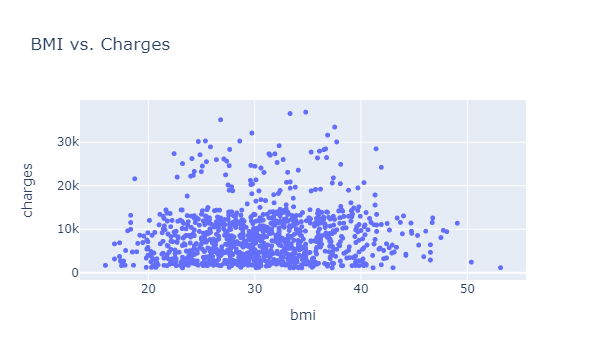

In [15]:
fig = px.scatter(non_smoker_df, x='bmi', y='charges', title='BMI vs. Charges')
fig.update_traces(marker_size=5)
fig.show()

Going a step further, Let's add the final numeric column: "children", which seems to have some correlation with "charges".

$charges = w_1 \times age + w_2 \times bmi + w_3 \times children + b$

In [16]:
non_smoker_df.charges.corr(non_smoker_df.children)

0.13892870453542208

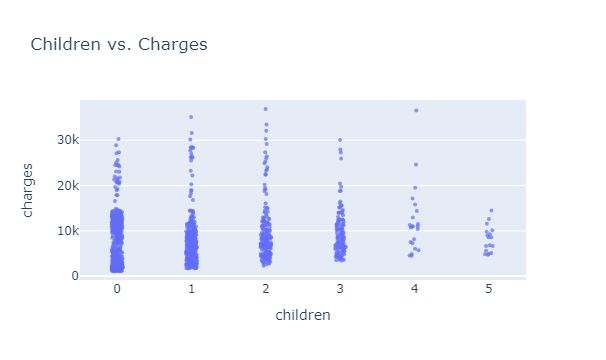

In [8]:
fig = px.strip(non_smoker_df, x='children', y='charges', title='Children vs. Charges')
fig.update_traces(marker_size=4, marker_opacity=.7)
fig.show()

In [13]:
from sklearn.linear_model import LinearRegression

# Create inputs and targets
inputs, targets = non_smoker_df[['age', 'bmi', 'children']], non_smoker_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to eveluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 4608.470405038246


* To train a linear regression model to estimate medical charges for all customers.
* To visualize the targets and predictions.
* To compute the loss to know if this loss is lower or higher?

In [14]:
# Create inputs and targets
inputs, targets = medical_df[['age', 'bmi', 'children']], medical_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to eveluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 11355.317901125973


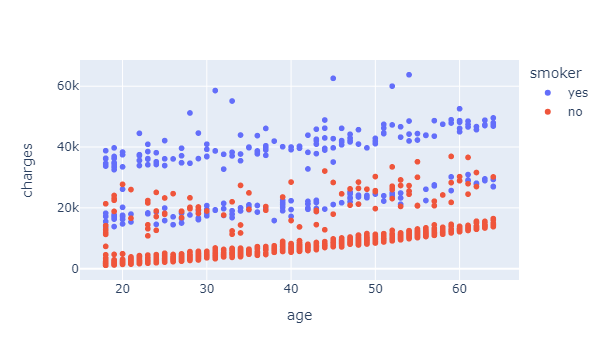

In [15]:
fig = px.scatter(medical_df, x='age', y='charges', color='smoker')
fig.show()

### Using Categorical Features for Machine Learning 
Let's convert the catergorical columns to numbers, then we can use them in computations. There are three common techniques for doing this:

1. categorical columns with two categories (binary category), then we can replace their values with 0 and 1.
2. categorical columns with more than two categories, we perform one-hot encoding i.e. create a new column for each category with 1s and 0s.
3. If the categories have a natural order (e.g. cold, neutral, warm, hot), then they can be converted to numbers (e.g. 1, 2, 3, 4) preserving the order. These are called ordinals.


### Binary Categories
The "smoker" column has just two values _yes_ and _no_. Let's create a new column `smoker_code` containing `0` for `no` and `1` for `yes`.

<Axes: xlabel='smoker', ylabel='charges'>

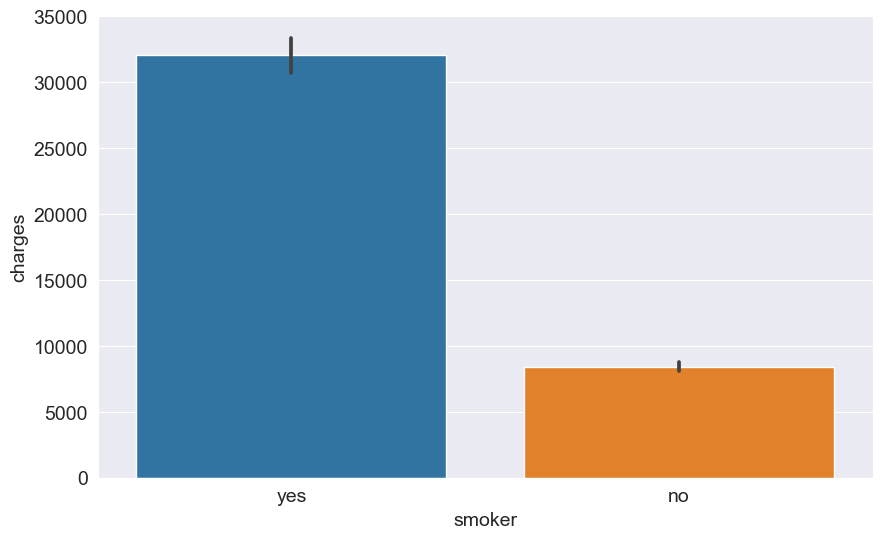

In [16]:
sns.barplot(data=medical_df, x='smoker', y='charges')

In [7]:
smoker_codes = {'no':0, 'yes':1}
medical_df['smoker_code'] = medical_df.smoker.map(smoker_codes)

In [18]:
medical_df

,age,sex,bmi,children,smoker,region,charges,smoker_code
0,19,female,27.900,0,yes,southwest,16884.92400,1
1,18,male,33.770,1,no,southeast,1725.55230,0
2,28,male,33.000,3,no,southeast,4449.46200,0
3,33,male,22.705,0,no,northwest,21984.47061,0
4,32,male,28.880,0,no,northwest,3866.85520,0
...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0
1334,18,female,31.920,0,no,northeast,2205.98080,0
1335,18,female,36.850,0,no,southeast,1629.83350,0
1336,21,female,25.800,0,no,southwest,2007.94500,0


In [20]:
medical_df.charges.corr(medical_df.smoker_code)

0.7872514304984771

To use `smoker_code` column for linear regression.
$charges = w_1 \times age + w_2 \times bmi + w_3 \times children + w_4 \times smoker + b$

In [19]:
# Create inputs and targets
inputs, targets = medical_df[['age', 'bmi', 'children', 'smoker_code']], medical_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to evluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 6056.439217188081


The loss reduces from `11355` to `6056`, almost by `50%`! 

__N.B:__ never ignore categorical data.

Adding the `sex` column for linear regression.
$charges = w_1 \times age + w_2 \times bmi + w_3 \times children + w_4 \times smoker + w_5 \times sex + b$

<Axes: xlabel='sex', ylabel='charges'>

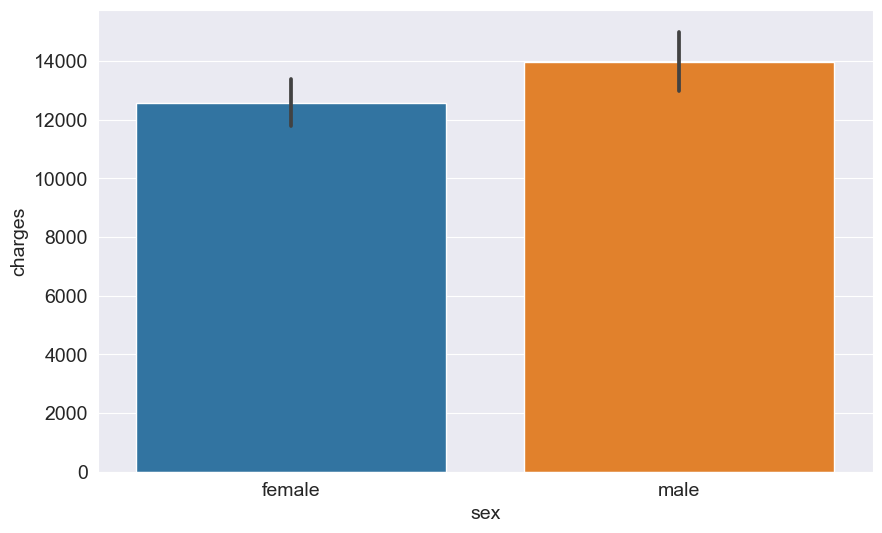

In [21]:
sns.barplot(data=medical_df, x='sex', y='charges')

In [8]:
sex_codes = {'female':0, 'male':1}
medical_df['sex_code'] = medical_df.sex.map(sex_codes)
medical_df

,age,sex,bmi,children,smoker,region,charges,smoker_code,sex_code
0,19,female,27.900,0,yes,southwest,16884.92400,1,0
1,18,male,33.770,1,no,southeast,1725.55230,0,1
2,28,male,33.000,3,no,southeast,4449.46200,0,1
3,33,male,22.705,0,no,northwest,21984.47061,0,1
4,32,male,28.880,0,no,northwest,3866.85520,0,1
...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0,1
1334,18,female,31.920,0,no,northeast,2205.98080,0,0
1335,18,female,36.850,0,no,southeast,1629.83350,0,0
1336,21,female,25.800,0,no,southwest,2007.94500,0,0


In [23]:
medical_df.sex_code.corr(medical_df.charges)

0.05729206220202535

In [24]:
# Create inputs and targets
inputs, targets = medical_df[['age', 'bmi', 'children', 'smoker_code', 'sex_code']], medical_df['charges']

# create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 6056.100708754546


Adding the `sex_code` column does not have a significant impact on the loss. Since is has a weak correlation with `charges`

### One-hot Encoding
The `region` column contains 4 values, so we'll use hot encoding and create a new column for each region.

<Axes: xlabel='region', ylabel='charges'>

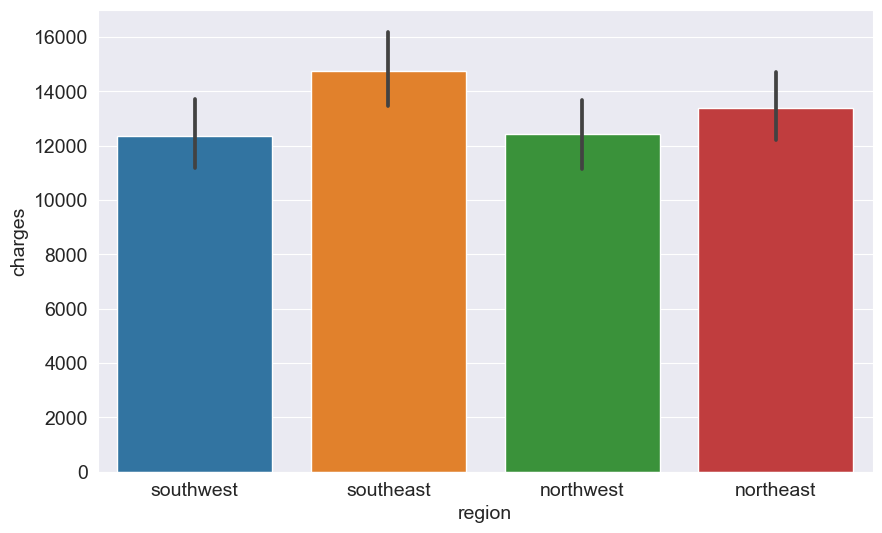

In [25]:
sns.barplot(data=medical_df, x='region', y='charges')

In [10]:
from sklearn import preprocessing
enc = preprocessing.OneHotEncoder()
enc.fit(medical_df[['region']])
enc.categories_

[array(['northeast', 'northwest', 'southeast', 'southwest'], dtype=object)]

In [14]:
enc.transform([['northeast'],
               ['northwest'],
               ['southeast']]).toarray()

C:\Users\seyi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.]])

In [15]:
one_hot = enc.transform(medical_df[['region']]).toarray()
one_hot

array([[0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.]])

In [17]:
medical_df[['northeast', 'northwest', 'southeast', 'southwest']] = one_hot

In [18]:
medical_df

,age,sex,bmi,children,smoker,region,charges,smoker_code,sex_code,northeast,northwest,southeast,southwest
0,19,female,27.900,0,yes,southwest,16884.92400,1,0,0.0,0.0,0.0,1.0
1,18,male,33.770,1,no,southeast,1725.55230,0,1,0.0,0.0,1.0,0.0
2,28,male,33.000,3,no,southeast,4449.46200,0,1,0.0,0.0,1.0,0.0
3,33,male,22.705,0,no,northwest,21984.47061,0,1,0.0,1.0,0.0,0.0
4,32,male,28.880,0,no,northwest,3866.85520,0,1,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0,1,0.0,1.0,0.0,0.0
1334,18,female,31.920,0,no,northeast,2205.98080,0,0,1.0,0.0,0.0,0.0
1335,18,female,36.850,0,no,southeast,1629.83350,0,0,0.0,0.0,1.0,0.0
1336,21,female,25.800,0,no,southwest,2007.94500,0,0,0.0,0.0,0.0,1.0


Let's include the region columns into our linear regression model.
$charges = w_1 \times age + w_2 \times bmi + w_3 \times children + w_4 \times smoker + w_5 \times sex + w_6 \times northeast + w_7 \times northwest + w_8 \times southeast + w_9 \times southwest + b$

In [19]:
from sklearn.linear_model import LinearRegression

In [24]:
# Create inputs and targets 
input_cols = ['age', 'bmi', 'children', 'smoker_code', 'sex_code', 'northeast', 'northwest', 'southeast', 'southwest']
inputs, targets = medical_df[input_cols], medical_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate predictions
predictions = model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print(f'Loss: {loss}')

Loss: 6041.679651174452
